In [ ]:
"""
Problem: Segmenting Images for Surface and Hidden Landmines in Aerial Drone Thermal Images.
"""
""" Image segmentation with a U-Net architecture to segment area with surface or hidden landmines in aerial 
thermal images

"""
"""
Trained an U-Net model on VisDrone2019 dataset on Tensorflow Framework Using Keras Functional API
Applied the trained U-Net model to segment images for hidden landmines in
LANDMINE THERMAL IMAGE SERIES Dataset
https://ieee-dataport.org/open-access/landmine-thermal-image-series files

Datasets used are downloaded in the local storage
"""

In [211]:
import os
import io
import sys
import scipy.io
import scipy.misc
import re



from glob2 import glob
from six import BytesIO
import pandas as pd
import tensorflow as tf
from sklearn import preprocessing
from tensorflow.keras import layers
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Reshape
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

import csv
import matplotlib 
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as patches
import pathlib
import PIL
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps


import traceback
import numpy.random as npr





In [3]:
tf.compat.v1.keras.layers.enable_v2_dtype_behavior()

#from tensorflow.python.framework.ops import disable_eager_execution
#disable_eager_execution()

from tensorflow.python.compiler.mlcompute import mlcompute
mlcompute.set_mlc_device(device_name='any')


#from tensorflow.python.compiler.mlcompute import mlcompute
#mlcompute.set_mlc_device(device_name='any')
#tf.compat.v1.disable_eager_execution()
print("Num GPUs Available: ", len(tf.config.list_physical_devices('cpu')))
print(" Physical devices:" , tf.config.list_physical_devices('cpu'))
print("is_apple_mlc_enabled %s" % mlcompute.is_apple_mlc_enabled())
print("is_tf_compiled_with_apple_mlc %s" % mlcompute.is_tf_compiled_with_apple_mlc())
print(f"eagerly? {tf.executing_eagerly()}")

print(tf.config.list_logical_devices())





Num GPUs Available:  0
 Physical devices: []
is_apple_mlc_enabled True
is_tf_compiled_with_apple_mlc True
eagerly? True
[LogicalDevice(name='/device:CPU:0', device_type='CPU')]


In [5]:
#from keras.models import Input, Model
from tensorflow.keras.layers.experimental import preprocessing 
from tensorflow.keras.optimizers import Adam
from IPython.display import clear_output
from IPython.display import Image, display
print("\u2022 Using TensorFlow Version:", tf.__version__)

• Using TensorFlow Version: 2.4.0-rc0


In [ ]:

"""
https://github.com/VisDrone/VisDrone-Dataset
Citation:
@ARTICLE{9573394,
  author={Zhu, Pengfei and Wen, Longyin and Du, Dawei and Bian, Xiao and Fan, Heng and Hu, Qinghua and Ling, Haibin},
  journal={IEEE Transactions on Pattern Analysis and Machine Intelligence}, 
  title={Detection and Tracking Meet Drones Challenge}, 
  year={2021},
  volume={},
  number={},
  pages={1-1},
  doi={10.1109/TPAMI.2021.3119563}}
"""
"""
VisDromes2019 is a large-scale benchmark dataset with carefully annotated ground-truth for various important 
computer vision tasks, named VisDrone, to make vision meet drones. The VisDrone2019 dataset is collected by 
the AISKYEYE team at Lab of Machine Learning and Data Mining , Tianjin University, China. 
The benchmark dataset consists of 288 video clips formed by 261,908 frames and 10,209 static images,
captured by various drone-mounted cameras, covering a wide range of aspects including location(taken from 14 different cities separated by thousands of kilometers in China), 
environment (urban and country), 
objects (pedestrian, vehicles, bicycles, etc.), and 
density (sparse and crowded scenes).
Note that, the dataset was collected using various drone platforms (i.e., drones with different models),
in different scenarios, and under various weather and lighting conditions. 
These frames are manually annotated with more than 2.6 million bounding boxes of targets of frequent interests,
such as pedestrians, cars, bicycles, and tricycles. Some important attributes including scene visibility,
object class and occlusion, are also provided for better data utilization.
"""
#https://github.com/VisDrone/VisDrone2018-DET-toolkit
#Annotation file format
 #<bbox_left>,<bbox_top>,<bbox_width>,<bbox_height>,<score>,<object_category>,<truncation>,<occlusion>


   # Name                                                  Description
#-------------------------------------------------------------------------------------------------------------------------------     
 #<bbox_left>	     The x coordinate of the top-left corner of the predicted bounding box

 #<bbox_top>	     The y coordinate of the top-left corner of the predicted object bounding box

 #<bbox_width>	     The width in pixels of the predicted object bounding box

#<bbox_height>	     The height in pixels of the predicted object bounding box

#   <score>	     The score in the DETECTION file indicates the confidence of the predicted bounding box enclosing 
                    # an object instance.
                    # The score in GROUNDTRUTH file is set to 1 or 0. 1 indicates the bounding box is considered in evaluation, 
                    # while 0 indicates the bounding box will be ignored.
                      
#<object_category>    The object category indicates the type of annotated object, (i.e., ignored regions(0), pedestrian(1), 
                     #people(2), bicycle(3), car(4), van(5), truck(6), tricycle(7), awning-tricycle(8), bus(9), motor(10), 
                     #others(11))
                      
#<truncation>	     The score in the DETECTION result file should be set to the constant -1.
                    # The score in the GROUNDTRUTH file indicates the degree of object parts appears outside a frame 
                     #(i.e., no truncation = 0 (truncation ratio 0%), and partial truncation = 1 (truncation ratio 1% ~ 50%)).
                      
#<occlusion>	     The score in the DETECTION file should be set to the constant -1.
                    # The score in the GROUNDTRUTH file indicates the fraction of objects being occluded (i.e., no occlusion = 0 
                     #(occlusion ratio 0%), partial occlusion = 1 (occlusion ratio 1% ~ 50%), and heavy occlusion = 2 
                     #(occlusion ratio 50% ~ 100%)).



In [8]:
#Explore an image from the dataset
# summarize some details about the image

path_image='Downloads/VisDrone2019-DET-train/images/0000002_00005_d_0000014.jpg'
# load the image and convert into
# numpy array
img = PIL.Image.open(path_image)
  
# asarray() class is used to convert
# PIL images into NumPy arrays
np_imagetest = np.array(img)
  
# <class 'numpy.ndarray'>
print(type(np_imagetest))
W,H,D= (np_imagetest).shape 
#  shape
print((np_imagetest).shape)



<class 'numpy.ndarray'>
(540, 960, 3)


In [9]:
# extract image id
path_img=path_image
image_id = path_img.split('/')[-4:]
path_mask= image_id[0]+'/'+image_id[1]+'/masks/'+image_id[3]
print(path_mask)
print(image_id[0])

Downloads/VisDrone2019-DET-train/masks/0000002_00005_d_0000014.jpg
Downloads


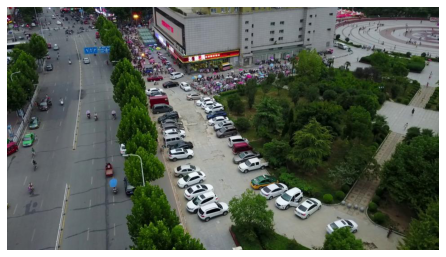

In [10]:
#Visualizing the images
# Create figure and axes
fig = plt.figure(frameon=False)
  
ax = plt.Axes(fig, [0., 0., 1., 1.])
ax.set_axis_off()
fig.add_axes(ax)

# Display the image
ax.imshow(np_imagetest)



In [ ]:
#Preapring ETL pipeline for the VisDrone2019 dataset
#Define function to create masks for images from corresponding annotation files in VisDrone2019 dataset
#Coded by me: Rumana Ahmad https://github.com/ultravioletrad. 

In [12]:

def create_mask(image_filepath,anno_filepath): 
    
    path_b=anno_filepath
    path_img=image_filepath

     # extract image id
    image_id = path_img.split('/')[-4:]
    path_mask=image_id[0]+'/'+image_id[1]+'/masks/'+image_id[3]
    data_df = pd.read_csv(path_b, delimiter = ',',header=None)
    
    #<bbox_left>,<bbox_top>,<bbox_width>,<bbox_height>,<score>,<object_category>,<truncation>,<occlusion>
    #(x1,y1,w1,h1,sc,cat,tr,oc)= line
     
    data_df.columns=['x1','y1','w1','h1','sc','cat','tr','oc']    
    #print(data_df.info())
    listdf=data_df[['x1','y1','w1','h1']].values.tolist()
    #image_id = path_img.split('/')[-1]
    
    img = PIL.Image.open(path_img)
  
    # asarray() class is used to convert
    # PIL images into NumPy arrays
    np_image = np.array(img)

    # <class 'numpy.ndarray'>
    
    W,H,D= (np_image).shape 
    x = np.zeros(np_image.shape[:-1])+3
    fig, ax = plt.subplots(1)
    for i in range(len(listdf)): 
        [x1,y1,w1,h1]=listdf[i]
        bbox_list=[x1,y1,w1,h1]
    
        bbox=bbox_list
        #print(bbox)
        rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1,
                         edgecolor='r', facecolor="g")
 
        ax.add_patch(rect)
        plt.axis('off')
    
        ax.imshow(x)
    # Create figure and axes
    
    buff=io.BytesIO()
    fig.savefig(buff, format='jpg', dpi='figure')
    buff.seek(0)
    
    img_mask = np.frombuffer(buff.getvalue(), dtype= 'uint8',count= -1, offset=0)
    
    fig.savefig(path_mask, bbox_inches='tight', pad_inches=0)   
    buff.close()
    plt.close(fig) 
    
    mask_arr = PIL.Image.open(path_mask)
    arr = np.array(mask_arr)
    mask_bool=np.where(arr>0,1,0)
    mask=np.ma.MaskedArray(arr,mask_bool)
    im = PIL.Image.fromarray(mask)
    im.save(path_mask)
    mask_arr.close()
    im.close()
    

In [13]:
 
train_dataset_dir = 'Downloads/VisDrone2019-DET-train' 
test_dataset_dir = 'Downloads/VisDrone2019-DET-test-dev'
val_dataset_dir = 'Downloads/VisDrone2019-DET-val'
# define data locations for images and annotations
train_images_dir = train_dataset_dir + '/images/'
train_annotations_dir = train_dataset_dir + '/annotations/'
train_masks_dir = train_dataset_dir + '/masks/'


test_images_dir = test_dataset_dir + '/images/'
test_annotations_dir = test_dataset_dir + '/annotations/'
test_masks_dir = test_dataset_dir + '/masks/'

val_images_dir = val_dataset_dir + '/images/'
val_annotations_dir = val_dataset_dir + '/annotations/'
val_masks_dir = val_dataset_dir + '/masks/'
      


In [14]:

def process_dataset(dataset_dir):
        # define data locations for images and annotations
        images_dir = dataset_dir + '/images/'
        annotations_dir = dataset_dir + '/annotations/'
        masks_dir = dataset_dir + '/masks/'
        
        # Iterate through all files in the folder to 
        #add class, images and annotaions
        imgId =[]
        imgPath = []
        maskPath = []
        bboxPath = []
        #for i in range(num_images):
        img_fileslist=list(sorted(os.listdir(images_dir)))
        annotations_fileslist=list(sorted(os.listdir(annotations_dir)))
        for filename in img_fileslist:   
               
               # setting image file
               path_img = images_dir + filename
               path_mask = masks_dir + filename
               # adding images and annotations to dataset
               #self.add_image('dataset', image_id=image_id, path=path_img, annotation= path_bb)
               imgPath.append(path_img)
               maskPath.append(path_mask) 
        for filename in annotations_fileslist:
               # extract image id
               #image_id =  filename[-4:]
                # setting annotations file
               path_bb =  annotations_dir + filename
               bboxPath.append(path_bb)
               #imgId.append(image_id)
           
        return imgPath,bboxPath,maskPath

In [15]:
train_files,trainAnno_files,train_masks = process_dataset(train_dataset_dir)
test_files,testAnno_files,test_masks = process_dataset(test_dataset_dir)
val_files,valAnno_files,val_masks = process_dataset(val_dataset_dir)

In [ ]:
#Creating masks in the local storage 
#Do not run this cell if the required data is already present, 6472 masks of all images
for img_file,anno_file in list(zip(train_files[64],trainAnno_files[5748:5751])):
     create_mask(img_file,anno_file)

In [ ]:
#Creating masks in the local storage 
#Do not run this cell if the required data is already present
for img_file,anno_file in list(zip(test_files[1590:1610],testAnno_files[1550:1610])):
    create_mask(img_file,anno_file)

In [ ]:
#Creating masks in the local storage 
#Do not run this cell if the required data is already present
for img_file,anno_file in list(zip(val_files[548:591],valAnno_files[548:591])):
    create_mask(img_file,anno_file)

In [16]:
img_size=128,128
train_size =len(train_files[0:6472])
test_size = len(val_files[0:548])
val_size = len(test_files[0:1610])


num_examples = train_size + val_size + test_size
print("num_examples:",num_examples)
train_ratio=train_size/num_examples
test_ratio=test_size/num_examples
val_ratio=val_size/num_examples
print("test-train-val-split:")
print("train_size:",train_size, "test_size:",test_size,"val_size:",val_size )
train_length=train_size
test_length=test_size
val_length=val_size
print(f"train_ratio:{train_ratio:.2f}")
print(f"test_ratio:{test_ratio:.2f}")
print(f"val_ratio:{val_ratio:.2f}")
batch_size = 6
buffer_size = 8
STEPS_PER_EPOCH = int(train_size // batch_size)
print("Steps per Epoch",STEPS_PER_EPOCH)
EPOCHS = 5

VALIDATION_STEPS = val_size//batch_size
print("Validation Steps:",VALIDATION_STEPS)
VAL_SUBSPLITS = 1

num_examples: 8629
test-train-val-split:
train_size: 6471 test_size: 548 val_size: 1610
train_ratio:0.75
test_ratio:0.06
val_ratio:0.19
Steps per Epoch 1078
Validation Steps: 268


In [229]:
def process_img(file_path):
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.uint8)
    img = tf.image.resize(img/255, size= (128 ,128))
    return img 

In [209]:

def load_img_mask(x,y):
    img = process_img(x)
    mask = process_img(y)
        
    return img,mask

In [18]:
train_dataset=tf.data.Dataset.from_tensor_slices((train_files,train_masks))

In [19]:
print(type(train_dataset.take(1)))
for tensor in  train_dataset.take(1):      
       print((tensor[0]))
       print((tensor[1]))
       
        

<class 'tensorflow.python.data.ops.dataset_ops.TakeDataset'>
tf.Tensor(b'Downloads/VisDrone2019-DET-train/images/0000002_00005_d_0000014.jpg', shape=(), dtype=string)
tf.Tensor(b'Downloads/VisDrone2019-DET-train/masks/0000002_00005_d_0000014.jpg', shape=(), dtype=string)


In [20]:
train_dataset = train_dataset.map(load_img_mask)


In [21]:
train_dataset = train_dataset.shuffle(buffer_size = buffer_size)
train_dataset = train_dataset.batch(batch_size = batch_size) 

In [22]:
print(train_dataset)

<BatchDataset shapes: ((None, 128, 128, 3), (None, 128, 128, 3)), types: (tf.float32, tf.float32)>


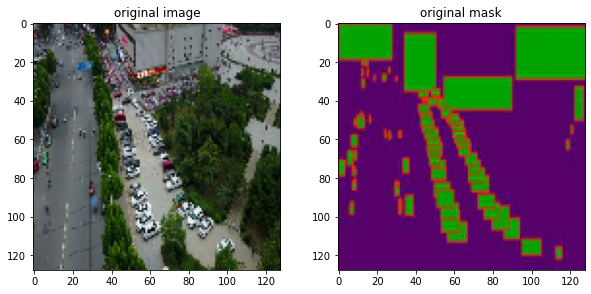

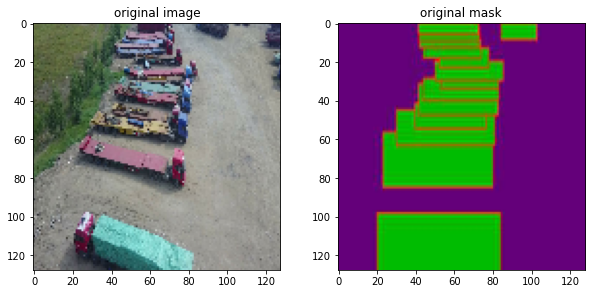

In [208]:
#Visualizing the Dataset images & prepared masks
for img,mask in train_dataset.take(2):
     
        fig = plt.figure(figsize =(10,10))
        fig.tight_layout()
        fig.add_subplot(2,2,1).set_title('original image')
        #print(img[0])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(img[0]))
        
        fig.add_subplot(2,2,2).set_title('original mask')
           #display_mask 
        plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[0]))
        #print(mask[0])     
     

In [24]:
validate_dataset=tf.data.Dataset.from_tensor_slices((test_files,test_masks))
validate_dataset = validate_dataset.map(load_img_mask).batch(batch_size=batch_size)


In [25]:
test_dataset1=tf.data.Dataset.from_tensor_slices((val_files,val_masks))
test_dataset1 = test_dataset1.map(load_img_mask).batch(batch_size=batch_size)


In [26]:
test_dataset1.take(1)

<TakeDataset shapes: ((None, 128, 128, 3), (None, 128, 128, 3)), types: (tf.float32, tf.float32)>

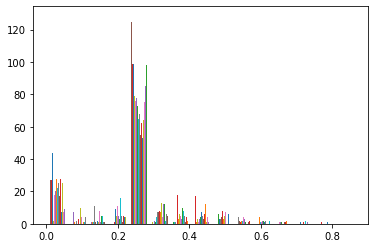

In [27]:
#plot histogram to view
for img,mask in train_dataset.take(1):
    mask=mask[0]
    plt.hist(mask[:,:,0],bins=15)


In [ ]:

"""
Image segmentation with a U-Net architecture Using Keras Functional API
"""

In [29]:
#Code credit Margaret Maynard-Reid
#https://pyimagesearch.com/2022/02/21/u-net-image-segmentation-in-keras/
#U-Net Image Segmentation in Keras

In [30]:
def double_conv_block(x,n_filters):
    
    #Conv2D then ReLU activation
    #kernel_initializer="he_normal"
    x = layers.Conv2D(n_filters,3,padding="same",activation='relu',kernel_initializer="he_normal")(x)
    #Conv2D then ReLU activation
    #kernel_initializer="he_normal"
    x = layers.Conv2D(n_filters,3,padding="same",activation='relu',kernel_initializer="he_normal")(x)
    
    return x

In [31]:
#The Dropout layer randomly sets input units to 0 with a frequency of rate at each step during training time, which helps prevent overfitting. Inputs not set to 0 are scaled up by 1/(1 - rate) such that the sum over all inputs is unchanged.
#https://keras.io/api/layers/regularization_layers/dropout/



In [32]:
def downsample_block(x,n_filters):
    
    f = double_conv_block(x,n_filters)
    p = layers.MaxPool2D(2)(f)
    p = layers.Dropout(0.1)(p)
    
    return f,p

In [33]:
def upsample_block(x,conv_features,n_filters):
    #upsample https://keras.io/api/layers/convolution_layers/convolution2d_transpose/
    x = layers.Conv2DTranspose(n_filters,3,2,padding="same")(x)
    #Concatenate
    x = layers.concatenate([x,conv_features])
    #dropout
    #x = layers.Dropout(0.3)(x)
    #Conv2D twice with ReLU activation
    x = double_conv_block(x,n_filters)
    
    return x

In [34]:
#Build the U-Net Model

def unet_model_arch():
        
        #inputs
        inputs = layers.Input(shape=(128,128,3))

        #encoder :Compacting - Downsample
        #1- downsample
        f1, p1 = downsample_block(inputs,64)
        #2- downsample
        f2 ,p2 = downsample_block(p1,128)
        #3- downsample
        f3, p3 = downsample_block(p2,256)
        #4- downsample
        f4 ,p4 = downsample_block(p3,512)

        #Transition
        features = double_conv_block(p4,1024)

        #decoder: expanding-upsample

        #6-upsample
        us6 = upsample_block(features,f4,512)

        #7-upsample
        us7 = upsample_block(us6,f3,256)

        #8-upsample
        us8 = upsample_block(us7,f2,128)

        #9-upsample
        us9 = upsample_block(us8,f1,64)

        #outputs
        outputs = layers.Conv2D(3,1,padding="same",activation="softmax")(us9)

        #U-Net Model with Keras Functional API
        unet_model = tf.keras.Model(inputs,outputs,name="U-Net")
        
        return unet_model

In [35]:
unet_model = unet_model_arch()

In [36]:
unet_model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 64, 64, 64)   0           conv2d_1[0][0]                   
______________________________________________________________________________________________

In [37]:


unet_model.compile(optimizer=tf.keras.optimizers.Adam(0.0001),loss = 'mse',metrics=['accuracy'])

callbacks =[tf.keras.callbacks.ModelCheckpoint("landmine_area_segment.h5",save_best_only= True)]
#optimizer=tfa.optimizers.RectifiedAdam(lr=1e-3)

In [ ]:
train_preds = unet_model.predict(train_dataset)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: unsupported operand type(s) for -: 'NoneType' and 'int'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: unsupported operand type(s) for -: 'NoneType' and 'int'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


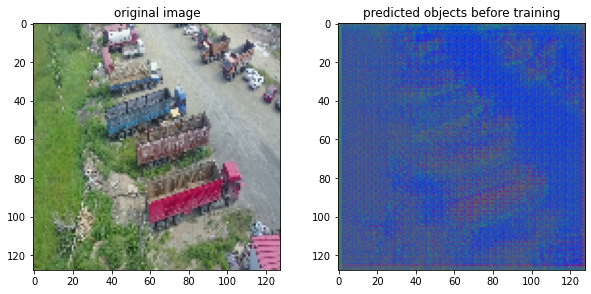

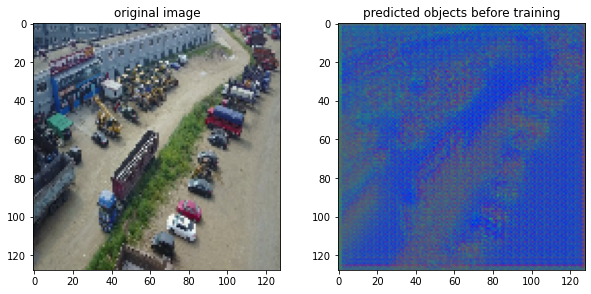

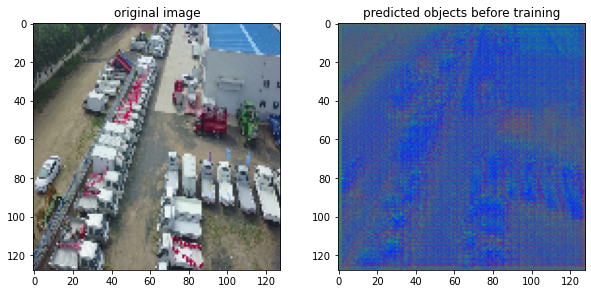

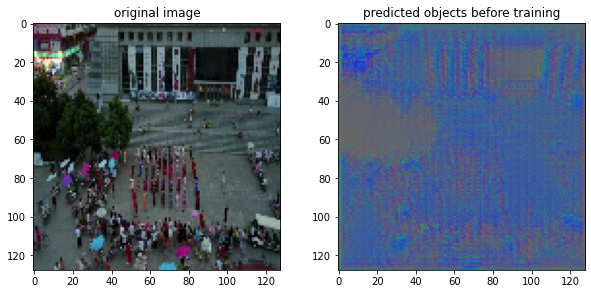

In [38]:
#Sanity Check Visualizing the U-Net Model output prediction before training
for image, mask in train_dataset.take(4):
        pred_mask = unet_model.predict(image)
        fig = plt.figure(figsize =(10,10))
        fig.tight_layout()
        fig.add_subplot(2,2,1).set_title('original image')
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image[0]))
        fig.add_subplot(2,2,2).set_title('predicted objects before training')
        plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[0]))
            

In [39]:
#Training the UNet Model on VisDrone2019 train data
model_history=unet_model.fit(train_dataset,
                epochs= EPOCHS,
                batch_size=batch_size,
                validation_data=validate_dataset,callbacks=callbacks)

Epoch 1/5
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: unsupported operand type(s) for -: 'NoneType' and 'int'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: unsupported operand type(s) for -: 'NoneType' and 'int'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
1079/1079 [==============================] - ETA: 0s - loss: 0.0279 - accuracy: 0.7034WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x177b33310> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSI

In [ ]:
test_preds = unet_model.predict(test_dataset1)


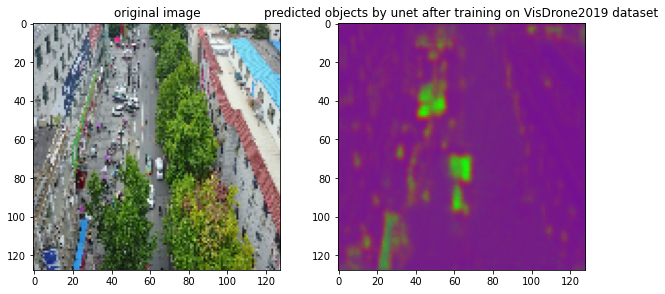

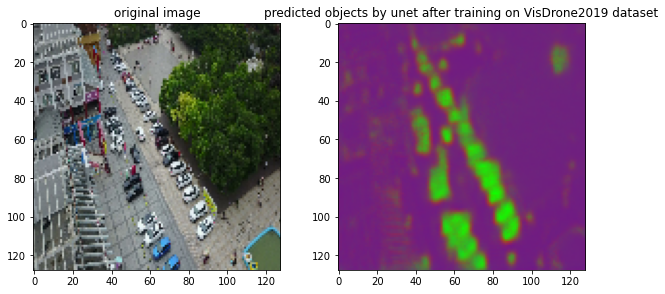

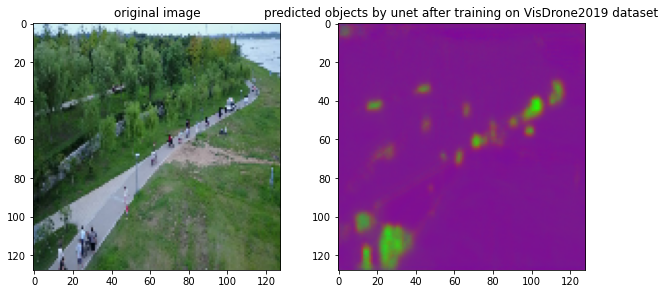

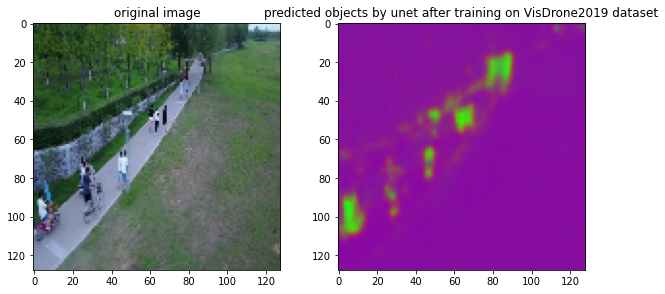

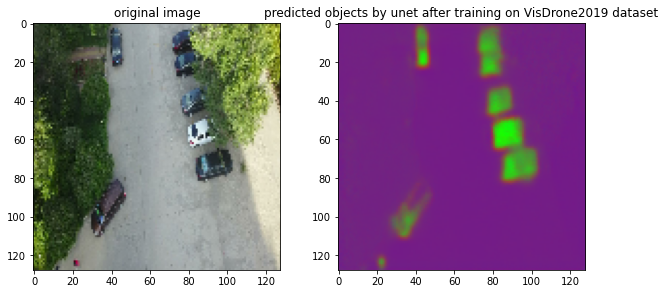

In [212]:
#Visualising the trained UNet Model Prediction on VisDrone2019 test data 
for image, mask in test_dataset1.take(5):
            pred_mask = unet_model.predict(image)
            pred_mask=(pred_mask-np.mean(pred_mask))
            fig = plt.figure(figsize =(10,10))
            fig.tight_layout()
            fig.add_subplot(2,2,1).set_title('original image')
            plt.imshow(tf.keras.preprocessing.image.array_to_img(image[0]))
            fig.add_subplot(2,2,2).set_title('predicted objects by unet after training on VisDrone2019 dataset')
            plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[0]))
            

In [41]:
# print(model_history.history.keys())
print(model_history.epoch)

[0, 1, 2, 3, 4]


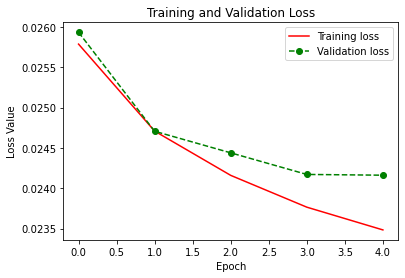

In [42]:
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']
accuracy = model_history.history['accuracy']
val_accuracy = model_history.history['val_accuracy']
epoch_num = model_history.epoch

plt.plot(epoch_num, loss, 'r', label='Training loss')
plt.plot(epoch_num, val_loss, 'go--', label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.title('Training and Validation Loss')
plt.legend()

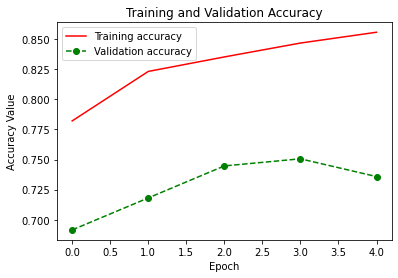

In [43]:
plt.plot(epoch_num, accuracy, 'r', label='Training accuracy')
plt.plot(epoch_num, val_accuracy, 'go--', label='Validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy Value')
plt.title('Training and Validation Accuracy')
plt.legend()

In [44]:
print(model_history.history.keys())
print(model_history.epoch)

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])
[0, 1, 2, 3, 4]


In [45]:
test_dataset1.enumerate

<bound method DatasetV2.enumerate of <BatchDataset shapes: ((None, 128, 128, 3), (None, 128, 128, 3)), types: (tf.float32, tf.float32)>>

In [46]:
results = unet_model.evaluate(test_dataset1, batch_size=batch_size)

92/92 [==============================] - 27s 284ms/step - loss: 0.0283 - accuracy: 0.7854


In [47]:
print("test loss, test accuracy:", results)

test loss, test accuracy: [0.028280504047870636, 0.7854025959968567]


In [ ]:
"""Trained an U-Net model on VisDrone2019 dataset on Tensorflow Framework Using Keras Functional API
Preparing the  LANDMINE THERMAL IMAGE SERIES Dataset ETL 
to segment images for hidden landmines using trained U-Net model """


In [206]:
masks_ds=list(sorted(os.listdir('Downloads/testimages/masks/')))
images_ds=list(sorted(os.listdir('Downloads/testimages/images/')))
print(len(masks_ds))
print(len(images_ds))

97
98


In [175]:
path_msk=['Downloads/testimages/masks/' + mask for mask in masks_ds]
path_img=['Downloads/testimages/images/' + image for image in images_ds]

In [223]:
print(path_msk[2])
print(path_img[3])

Downloads/testimages/masks/mine_mask10.JPEG
Downloads/testimages/images/image10.JPEG


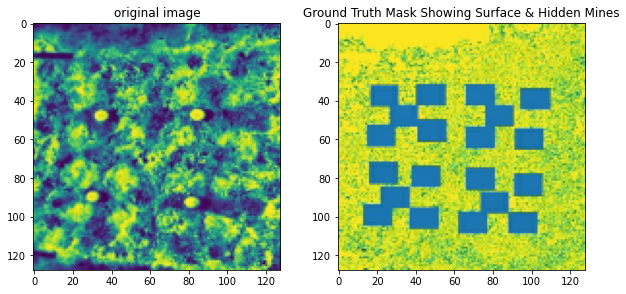

In [230]:
image_mines= process_img(path_img[3])
mask_mines = process_img(path_msk[2])
fig = plt.figure(figsize =(10,10))
fig.tight_layout()
fig.add_subplot(2,2,1).set_title('original image')
plt.imshow(tf.keras.preprocessing.image.array_to_img(image_mines))
fig.add_subplot(2,2,2).set_title('Ground Truth Mask Showing Surface & Hidden Mines')
plt.imshow(tf.keras.preprocessing.image.array_to_img(mask_mines))

In [195]:

test_tf = tf.data.Dataset.from_tensor_slices((path_img[2:97],path_msk[1:96]))

In [196]:
print(test_tf)
print(len(test_tf))

<TensorSliceDataset shapes: ((), ()), types: (tf.string, tf.string)>
95


In [197]:
print(type(test_tf.take(1)))
for tensor in  test_tf.take(1):      
       print((tensor[0]))
       print((tensor[1]))

<class 'tensorflow.python.data.ops.dataset_ops.TakeDataset'>
tf.Tensor(b'Downloads/testimages/images/image1.JPEG', shape=(), dtype=string)
tf.Tensor(b'Downloads/testimages/masks/mine_mask1.JPEG', shape=(), dtype=string)


In [198]:
test_tf = test_tf.map(load_img_mask)

In [203]:
test_tf= test_tf.batch(batch_size=batch_size)
test_tf.enumerate

<bound method DatasetV2.enumerate of <BatchDataset shapes: ((None, 128, 128, 3), (None, 128, 128, 3)), types: (tf.float32, tf.float32)>>

In [57]:
test2_preds=unet_model.predict(test_tf)

/var/folders/y5/383sdlcn58g_zqg_48133p0c0000gn/T/ipykernel_1434/149594728.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize =(10,10))


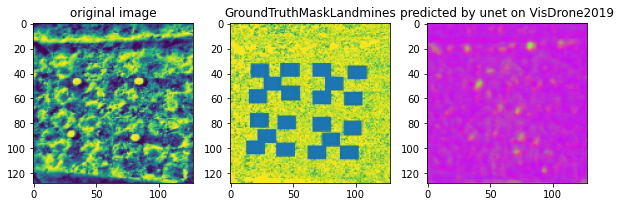

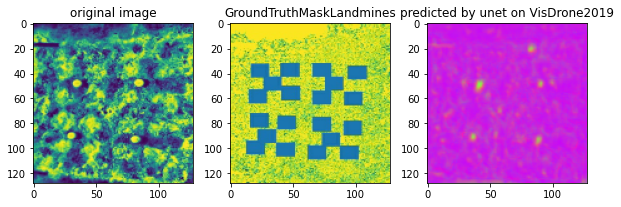

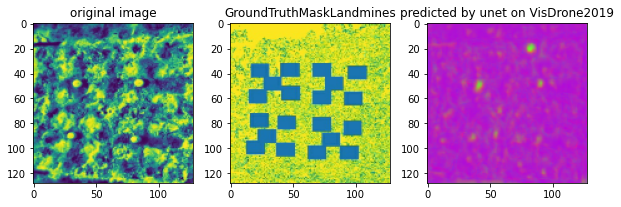

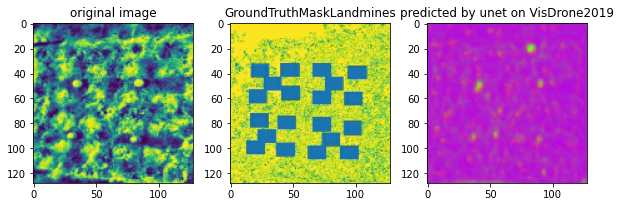

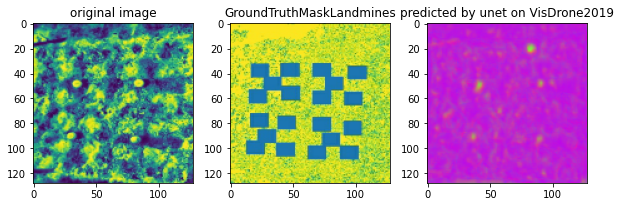

...

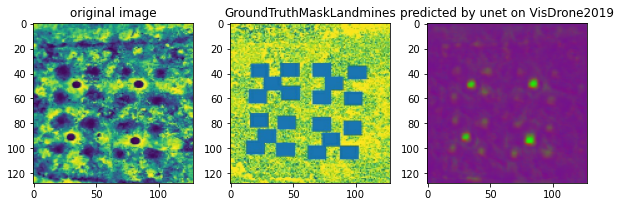

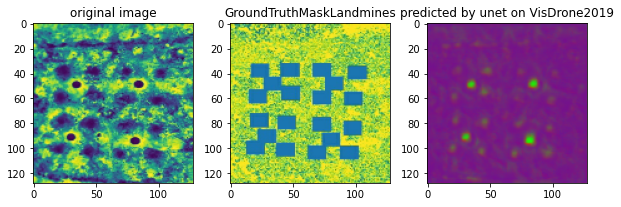

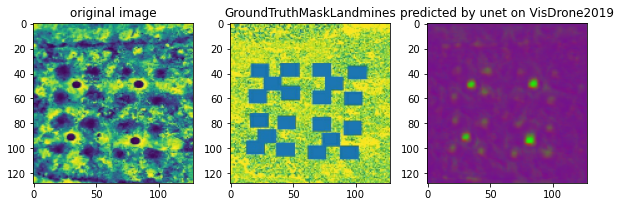

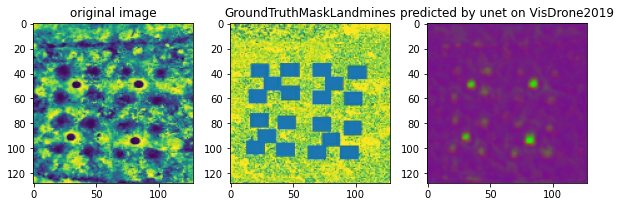

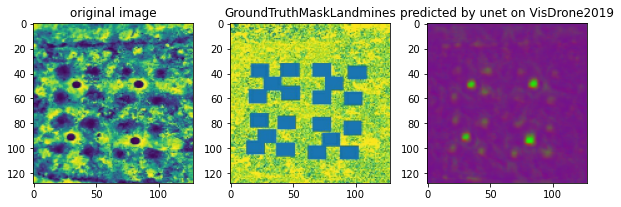

In [237]:
"""display U-Net model's prediction on LANDMINE THERMAL IMAGE SERIES Dataset never used in the training & validation ."""
for image, mask in test_tf.take(30):
            pred_mask = unet_model.predict(image)
            fig = plt.figure(figsize =(10,10))
            fig.tight_layout()
            fig.add_subplot(3,3,1).set_title('original image')
            plt.imshow(tf.keras.preprocessing.image.array_to_img(image[0]))
            fig.add_subplot(3,3,2).set_title('GroundTruthMaskLandmines')
            plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[0]))
            fig.add_subplot(3,3,3).set_title('predicted by unet on VisDrone2019')
            plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[0]))
            

In [205]:
results1 = unet_model.evaluate(test_tf)

95/95 [==============================] - 7s 68ms/step - loss: 0.1945 - accuracy: 0.1493
